In [2]:
%run "../Retropy_framework.ipynb"

In [6]:
mdf = pd.read_csv("../Research/GemelNet.csv")
mdf["month"] = pd.to_datetime(mdf["month"], format="%Y/%m/%d")
mdf["month_return"] = pd.to_numeric(mdf["month_return"].astype(str).str.replace("%", ""), errors="coerce")
mdf["net_flow"] = series_as_float(mdf["net_flow"])
mdf["AUM"] = series_as_float(mdf["AUM"])



/Users/gpitelko/anaconda3/envs/retropy/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning:

Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.



In [7]:
#mdf = mdf.set_index("month")

def getValue(df):
    df = df.set_index("month")
    ser = df["month_return"].dropna().copy()
    if len(ser) == 0:
        return pd.Series()
    prevMonth = ser.index[0] + pd.DateOffset(months=-1)
    ser[prevMonth] = 0 # we want the serie sto start at 1.0
    ser = ser.sort_index()
    ser.index = ser.index + pd.DateOffset(months=1)
    return (1+ser.dropna()/100).cumprod()

#sym = mdf[mdf["ID"] == 1544]
#ym["month_return"]
#getValue(sym).plot()

def getKeren(id, usd=True):
    df = mdf[mdf["ID"] == id]
    name = str(id) + " | " + df.iloc[0]["name"]
    s = getValue(df)
    if usd:
        usdils = getForex("USD", "ILS")
        s = (s/usdils).dropna()
    if len(s) > 0:
        s = s / s[0]
    s.id = id
    fee_df = series_as_float(df["fee_assets"]).dropna()
    if fee_df.shape[0] > 0:
        s.fee = fee_df.iloc[0]
    else:
        s.fee = np.nan
    return wrap(s, name)
    
def getAum(id):
    df = mdf[mdf["ID"] == id]
    name = str(id) + " | " + df.iloc[0]["name"]
    usdils = getForex("USD", "ILS")
    #aum = pd.to_numeric(df["AUM"].str.replace(",", "").replace("- - -", ""))
    #aum = pd.to_numeric(df["AUM"], errors="coerce")
    aum = series_as_float(df["AUM"])
    aum.index = df["month"]
    aum = aum/usdils
    aum = wrap(aum.dropna(), name + " AUM")
    return aum

def getFlow(id):
    df = mdf[mdf["ID"] == id]
    name = str(id) + " | " + df.iloc[0]["name"]
    usdils = getForex("USD", "ILS")
    #flow = pd.to_numeric(df["net_flow"].str.replace(",", "").replace("- - -", ""))
    flow = series_as_float(df["net_flow"])
    flow.index = df["month"]
    flow = flow/usdils
    flow = wrap(flow.dropna(), name + " flow")
    return flow

def getFlowSum(id):
    return getFlow(id).cumsum()


### כל קרנות ההשתלמות מגמל.נט

In [8]:
allKranotIDs = set(mdf.loc[mdf["type"]=="קרן השתלמות", "ID"].values)
allKranot = []
for id in allKranotIDs:
    keren = getKeren(id, usd=True)
    allKranot.append(keren)
    print(keren.name)
allKranot = [s for s in allKranot if len(s.s) > 0]

allKranotMenayot = [s for s in allKranot if "מניות" in s.name and not "ללא" in s.name and not "עד" in s.name and not "לפחות" in s.name]
allKranotKlali = [s for s in allKranot if "כללי" in s.name and not "לפחות" in s.name]
allKranotIBI = [s for s in allKranot if "אי.בי.אי" in s.name]
allKranotAltshuler = [s for s in allKranot if "אלטשולר" in s.name]


Fetching USD/ILS@IC from IC .. DONE
2048 |  *** מגדל השתלמות  הלכה
1537 | אינפיניטי השתלמות מניות בחו"ל
8704 | "אינטרגמל השתלמות"-מדד "תל בונד 20"
8705 | "אינטרגמל השתלמות"-מסלול מזומנים ושווי מזומנים
1542 | אקסלנס השתלמות בניהול אישי
2055 |  *** מיטב דש השתלמות חו"ל
1544 |  *** אי.בי.אי השתלמות פאסיבי - מדדי מניות חו"ל
1034 |  *** הראל השתלמות מסלול חו"ל
2058 | הלמן-אלדובי השתלמות שריעה
1038 | ילין לפידות קרן השתלמות מסלול אג"ח עד 25% מניות
7703 | אנליסט השתלמות כללי פאסיבי
2041 | ** מורים תיכוניים - מסלול הלכה
1059 |  *** פסגות שיא השתלמות פאסיבי-כללי
554 |  *** מיטב דש השתלמות עד 6 שנות וותק
2091 |  *** אקסלנס השתלמות אג"ח עד 20% מניות
558 |  *** אלטשולר שחם השתלמות אג"ח עד 15% במניות
2100 | אי.בי.אי השתלמות בניהול אישי
566 |  *** הראל השתלמות לטווח ארוך
(מסלול לאוכלוסיית יעד) 
8761 | הראל השתלמות IRA IRA
1083 | אינפיניטי השתלמות כללי
1084 | אינפיניטי השתלמות אג"ח
1085 | אינפיניטי השתלמות מניות בישראל
2114 | אינפיניטי השתלמות IRA בניהול אישי
579 |  *** מגדל השתלמות כללי
580 | ** שיב

7635 | ** עובדי מדינה - משולב-אג"ח עד 15 אחוז מניות
470 | מגדל השתלמות לבני 60 ומעלה
12256 | אלטשולר שחם השתלמות הלכה
481 | מיטב דש השתלמות  כללי פאסיבי
482 | ** מורים על יסודי
2018 |  *** פסגות שיא השתלמות  הלכה
484 | ** מורים וגננות - מסלול כללי
485 | ** מורים תיכוניים - מסלול כללי
8679 | אנליסט השתלמות אג"ח עד 20% במניות
2024 | הפניקס השתלמות בניהול אישי
1515 | פסגות השתלמות בניהול אישי
1523 |  *** הראל השתלמות מסלול כהלכה
2036 | ** מורים וגננות - מסלול אג"ח
2035 | ** מורים וגננות - מסלול הלכה
2038 | ** מורים תיכוניים - מסלול אג"ח
2039 | ** מורים וגננות - מסלול הלכה
2040 | ** מורים וגננות - מסלול אג"ח
2037 | ** מורים תיכוניים - מסלול הלכה
2042 | ** מורים תיכוניים - מסלול אג"ח
8701 | "אינטרגמל השתלמות"-מדד "מניות תל אביב 35"
1534 | כלל השתלמות הלכה
1535 | אנליסט השתלמות שקלי טווח קצר


### השוואה של קרן השתלמות מחקה ממדי חול איי-בי-איי למדדי חול

In [9]:
s = getKeren(1544)
bench = get("URTH")
bench = wrap(get("SPY:50|VGK:30|EEM:13|EWJ:7", mode="NTR"), "composite NTR")
benchTR = wrap(get("SPY:50|VGK:30|EEM:13|EWJ:7", mode="TR"), "composite TR")
vt = get("VT", mode="NTR")
show(s / bench, s, bench, vt, trim=True, legend=True)

Fetching URTH from AV .. DONE
Fetching SPY from AV .. DONE
Fetching VGK from AV .. DONE
Fetching EEM from AV .. DONE
Fetching EWJ from AV .. DONE
Fetching VT from AV .. DONE
trimmed data from 2005-03-11 [composite NTR] to 2011-12-01 [1544 |  *** אי.בי.אי השתלמות פאסיבי - מדדי מניות חו"ל / composite NTR, 1544 |  *** אי.בי.אי השתלמות פאסיבי - מדדי מניות חו"ל]


### השוואה של קרן השתלמות מחקה סנופי איי-בי-איי לסנופי

In [10]:
s = getKeren(2265)
bench = get("SPXNTR@IC")
spy = get("SPY", mode="NTR")
x = (s / bench).dropna()
show(x, s, bench, spy, trim=True)

Fetching SPXNTR@IC from IC .. DONE
trimmed data from 1995-01-03 [SPY] to 2015-03-01 [2265 | אי.בי.אי השתלמות מחקה מדד S&amp;P500 / SPXNTR@IC]


In [11]:
s = getKeren(9451)
bench = get("SPXNTR@IC")
spy = get("SPY", mode="NTR")
x = (s / bench).dropna()
show(x, s, bench, spy, trim=True)

trimmed data from 1995-01-03 [SPY] to 2016-04-01 [9451 | אינטרגמל השתלמות -מניות S&amp;P500 / SPXNTR@IC, 9451 | אינטרגמל השתלמות -מניות S&amp;P500]


In [12]:
intergemel = getKeren(9451)
ibi = getKeren(2265)
show(ibi / intergemel, ibi, intergemel, 1)


trimmed data from 2013-12-01 [2265 | אי.בי.אי השתלמות מחקה מדד S&amp;P500] to 2016-04-01 [2265 | אי.בי.אי השתלמות מחקה מדד S&amp;P500 / 9451 | אינטרגמל השתלמות -מניות S&amp;P500, 9451 | אינטרגמל השתלמות -מניות S&amp;P500]


### קרנות של איי.בי.איי

In [118]:
lst = [s for s in allKranot if s.index[0].year < 2008 and "אי.בי.אי" in s.name]
#lst = [s for s in lst if not " ** " in s.name] # exclude exclusive funds for specific sectors
lst = sorted(lst, key=lambda s: s.name.split("|")[1].strip(" *").split(" ")[0])
[(s.fee, s.name) for s in lst]

[(0.74, '1202 |  *** אי.בי.אי השתלמות אג"ח ללא מניות'),
 (0.7, '1203 | אי.בי.אי קרן השתלמות מסלול אג"ח עד 10% מניות'),
 (0.67, '1204 |  *** אי.בי.אי השתלמות כללי'),
 (0.74, '1205 |  *** אי.בי.אי השתלמות מניות')]

In [119]:
base = get("VT:60|VFITX:40", mode="NTR")
base = convertSeries(base, "USD", "ILS")
basem = bom(base)

lst = [s.dropna() for s in lst]
medianSer = getMedianSer(lst)

show(lst, base, basem, base/medianSer, 1, ta=True, legend=False)
shown = show(lst, basem, ta=True, silent=True);

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




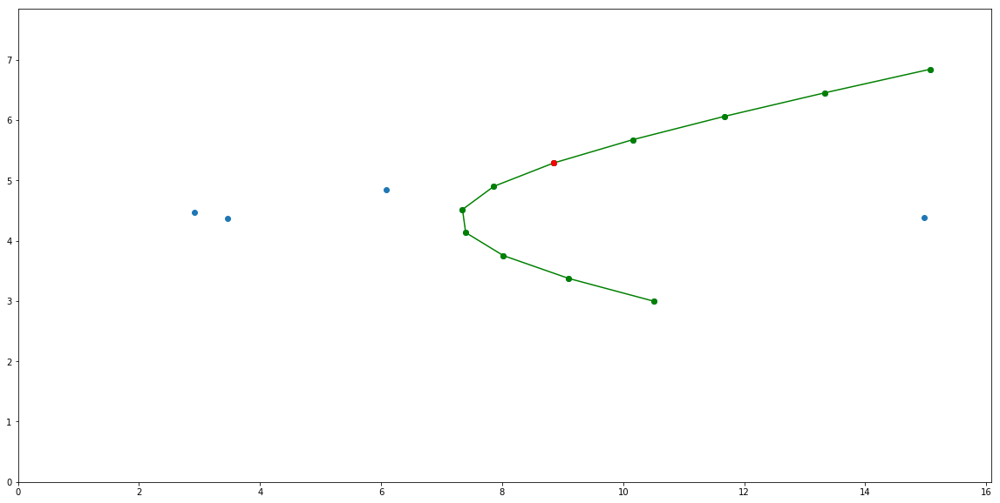

In [121]:
allbases = mix("VT", "VFITX", n=10, mode="NTR")
allbases = [convertSeries(b, "USD", "ILS") for b in allbases]
allbases = list(map(bom, allbases))
allbases = trimBy(allbases, shown)

showRiskReturn(shown + allbases)    
showRiskReturn(allbases, setlim=False, lines=True, color="green")
showRiskReturn([allbases[6]], setlim=False, lines=True, color="red")

In [88]:
s = getKeren(1205)
ases = [VXUS, SPY, IEF, get("USDILS@CUR"), GLD, VNQ, FDN]
bases = [EIS, VXUS, SPY, QQQ, IEF, get(i_gbLcl)]
bases = [EIS, VXUS, SPY, IEF]
bases = ["VFINX", i_ac, gb, i_gb]
bases = [bom(get(b, mode="NTR")) for b in bases]

#bases = [boy(b) for b in bases]
#s = boy(s)

p = lrret(bases, s, sum1=True)
show(p / s, 0, 1, log=False)
#lrret([FDN, VXUS], VTI, sum1=True)
#show(lup1)

Regressors: ['VFINX NTR', 'VGTSX NTR', 'VFITX NTR', 'BEGBX NTR']
Coefficients: [ 0.22299406  0.73756214  0.10887258 -0.06942877]
Variance score r^2: 0.713


/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




### השוואה של כל קרנות ההשתלמות במסלול כללי לתיק 60\40 פשוט

In [40]:
s = get("SPY", mode="NTR")
# this is a lame implementation, as it doesn't take into account the tax bases of dividend reinvestment
def liquidation(s):
    if "s" in dir(s):
        s = s.s
    return (s/s[0]-1)*0.75+1
show(s, liquidation(s), log=True, ta=True)

In [6]:
def getMedianSer(lst):
    df = pd.DataFrame([s.s for s in lst]).T
    return wrap(df.median(axis=1), "median")

def getMeanSer(lst):
    df = pd.DataFrame([s.s for s in lst]).T
    return wrap(df.mean(axis=1), "mean")

In [184]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

as_ILS = False
as_liqduid = False

usdils = getForex("ILS", "USD", inv=True)
usdils.name = "USDILS|USDILS"
stocks = wrap(get(f"{lc}:50|{i_ac}:50"), "~vt")
allbases1 = mix(stocks, gb, n=10, mode="NTR")
allbases1 = list(map(bom, allbases1))
allbases2 = mix(lc, gb, n=10, mode="NTR")
allbases2 = list(map(bom, allbases2))
#allbases1 += [usdils]
if as_ILS:
    allbases1 = [convertSeries(b, "USD", "ILS") for b in allbases1]
    allbases2 = [convertSeries(b, "USD", "ILS") for b in allbases2]
if as_liqduid:
    allbases1 = [liquidation(b) for b in allbases1]

allbases1 = allbases2
b = "VFINX:31|VGTSX:6|VFITX:52|MFBFX:11"
b = bom(get(b))

ta = convertSeries(get('TA125@IC'), "ILS", "USD", inv=True)
sources = [ta, lc, i_ac, gb, cb, usdils]
sources = lmap(get, sources)
sources = lmap(bom, sources)

    
def f(year):
    lst = allKranotMenayot
    lst = allKranotKlali
    #lst = allKranot
    #lst = allKranotIBI
    
    if as_ILS:
        lst = [convertSeries(b, "USD", "ILS") for b in lst]
    if as_liqduid:
        lst = [liquidation(b) for b in lst]
    
    
    lst = [s for s in lst if s.index[0].year < year]
    
    lst = [s for s in lst if not " ** " in s.name] # exclude exclusive funds for specific sectors
    lst = [s[str(year):] for s in lst]
    lst = [s for s in lst if s.shape[0] > 0]
    lst = sorted(lst, key=lambda s: s.name.split("|")[1].strip(" *").split(" ")[0])
    #lst += [usdils, b]
    #print("\n".join([s.name for s in lst]))
    
    lst = doTrim(lst)
    allbases = trimBy(allbases1, lst)
    lst = trimBy(lst, allbases)

    if True:
        fits = [lrret(s, sources, sum1=False, fit_values=True, pos_weights=False, return_ser=True) for s in lst]
        names = [s.name for s in lst]
        df = pd.DataFrame(dict(zip(names, fits)))
        display(df)

    
    # shoe risk return
    if False:
        plt.figure(figsize=(16, 10))
        showRiskReturn(lst, annotations=[s.name[::-1] for s in lst])    
        showRiskReturn(lst + allbases, annotations=False)    
        showRiskReturn(allbases, setlim=False, lines=True, color="green", annotations=False)
        if len(allbases) > 6:
            showRiskReturn([allbases[6]], setlim=False, lines=True, color="red")
        #showRiskReturn([usdils], setlim=False, lines=False, color="blue")
        plt.show()
    
    # show returns
    if False:
        if len(allbases) > 10:
            show(lst, allbases[0], allbases[10], allbases[6], legend=False, trim=False)
    
    # show relative returns
    if False:
        lst = [s / s[0] for s in lst]
        medianSer = getMeanSer(lst)
        lst = [s / medianSer for s in lst]
        show(lst, ta=False, legend=False)    
    

interact(f, year=widgets.IntSlider(min=2000,max=2018,step=1,value=2008));

interactive(children=(IntSlider(value=2008, description='year', max=2018, min=2000), Output()), _dom_classes=(…

In [188]:
s = getKeren(1204, usd=True)
usdils = getForex("ILS", "USD", inv=True)

ta = convertSeries(get('TA125@IC'), "ILS", "USD", inv=True)
sources = [usdils, lc, gb, i_ac, EIS, 'TTA25@IC', em_gbLcl, em_gbUsd]
sources = [ta, lc, i_ac, gb, cb, usdils]
sources = lmap(get, sources)
sources = lmap(bom, sources)

b = "VFINX:34|VGTSX:6|VFITX:54|MFBFX:12"

lrret(s, sources, sum1=False, fit_values=True, pos_weights=True, return_ser=True)
#show(b)


trimmed data from 2006-12-01 [1204 |  *** אי.בי.אי השתלמות כללי] to 2007-01-01 [1204 |  *** אי.בי.אי השתלמות כללי - fit]


1204 |  *** אי.בי.אי השתלמות כללי weights:


MFBFX        0.18
TA125@IC     0.25
USD/ILS@IC   0.71
VFINX        0.27
VFITX        0.14
VGTSX        0.00
dtype: float64

In [139]:
s = getKeren(579, usd=True)
usdils = getForex("ILS", "USD", inv=True)
sources = [usdils, lc, gb, i_ac, EIS, 'TTA25@IC']
sources = ['TA35@IC', lc]
ta = get('TA35@IC')
ta = convertSeries(ta, "ILS", "USD", inv=True)
sources = [ta, lc, i_ac, gb, cb]
sources = lmap(get, sources)
sources = lmap(bom, sources)
show_rolling_beta(s, sources, window=24, rsq=False, pvalue=False)

In [140]:
lst = [s for s in allKranot if s.index[0].year < 2010 and "מניות" in s.name and not "ללא" in s.name and not "עד" in s.name]
lst = [s for s in lst if not " ** " in s.name] # exclude exclusive funds for specific sectors
lst = sorted(lst, key=lambda s: s.name.split("|")[1].strip(" *").split(" ")[0])
[(s.fee, s.name) for s in lst]

[(0.74, '1205 |  *** אי.בי.אי השתלמות מניות'),
 (0.81, '1085 | אינפיניטי השתלמות מניות בישראל'),
 (0.67, '963 | אנליסט השתלמות מניות'),
 (nan, '797 |  *** אקסלנס השתלמות מניות'),
 (0.83, '968 |  *** אקסלנס השתלמות מניות'),
 (0.58, '738 |  *** הלמן-אלדובי השתלמות מניות'),
 (0.79, '763 | הראל השתלמות מסלול מניות'),
 (0.64, '1350 | כלל השתלמות מניות'),
 (0.82, '1157 |  *** מגדל השתלמות ביג כללי לפחות 30% מניות'),
 (0.72, '869 |  *** מגדל השתלמות מניות'),
 (0.6, '883 |  *** מיטב דש השתלמות מניות'),
 (0.63, '1256 |  *** מנורה השתלמות-מניות'),
 (0.52, '1409 | מנורה מבטחים השתלמות-מניות חו"ל'),
 (0.63, '612 |  *** פסגות שיא השתלמות מניות')]

In [141]:
base = get("VT:60|VFITX:40", mode="NTR")
basem = bom(base)

lst = [s.dropna() for s in lst]
medianSer = getMedianSer(lst)

show(lst, base, basem, base/medianSer, 1, ta=True, legend=False)
shown = show(lst, basem, ta=True, silent=True);

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




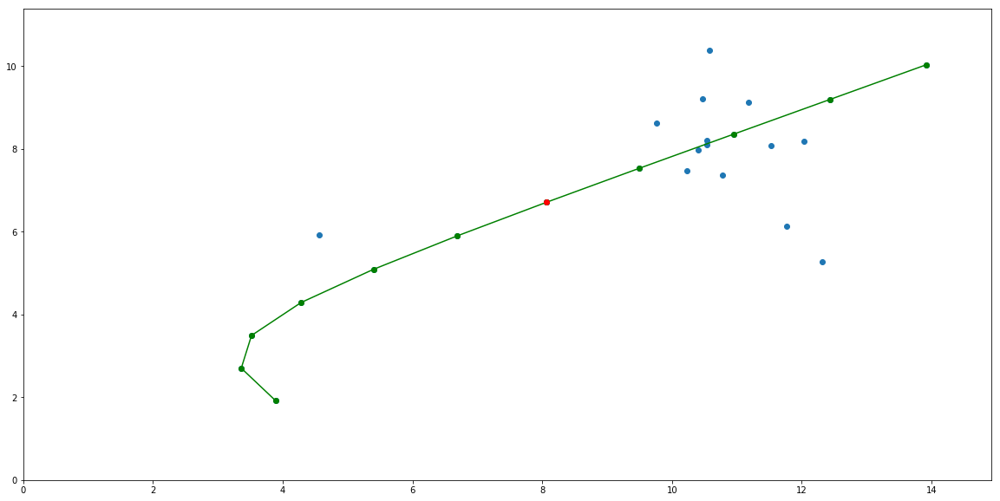

In [144]:
allbases = mix("VT", "VFITX", n=10, mode="NTR")
allbases = list(map(bom, allbases))
allbases = trimBy(allbases, shown)

showRiskReturn(shown + allbases)    
showRiskReturn(allbases, setlim=False, lines=True, color="green")
showRiskReturn([allbases[6]], setlim=False, lines=True, color="red")

### השוואה של כל קרנות ההשתלמות במסלול כללי לתיק 60\40 פשוט - השוואה יחסית בין הקרנות

In [77]:
lst = trimBy(lst, lst)
lst = [s / s[0] for s in lst]
# finals = [(s, s[-1]) for s in lst]
# finals = sorted(finals, key=lambda x: x[1])
# medianSer = finals[len(finals) // 2][0]

medianSer = getMedianSer(lst)
lst2 = [s / medianSer for s in lst]

show(lst2, base, ta=False, legend=False)

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




## סך נכסים מנוהלים וצבירה נטו לפי סוג קופה

In [41]:
aum = mdf.groupby(["month", "type"])["AUM"].sum()
aum = aum.unstack()
show(aum, ta=False, log=False, title="AUM")

net_flow = mdf.groupby(["month", "type"])["net_flow"].sum()
net_flow = net_flow.unstack()
net_flow = net_flow.cumsum()
total = net_flow.sum(axis=1)
total.name = "Total"
show(net_flow, total, ta=False, log=False, title="Cumulative Net Flow")

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/ipykernel/__main__.py:66: RuntimeWarning:

invalid value encountered in less_equal

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




## סך נכסים מנוהלים וצבירה נטו בקרנות השתלמות במסלול כללי

In [42]:
aums = list(map(getAum, allKranotIDs))
flowSums = list(map(getFlowSum, allKranotIDs))

In [43]:
aums = [s for s in aums if "כללי" in s.name]
aums = [s for s in aums if not " ** " in s.name] # exclude exclusive funds for specific sectors

flowSums = [s for s in flowSums if "כללי" in s.name]
flowSums = [s for s in flowSums if not " ** " in s.name] # exclude exclusive funds for specific sectors

In [44]:
show(aums, ta=False, legend=False)
show(flowSums, ta=False, legend=False)

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




## סך נכסים מנוהלים וצבירה נטו ותשואה בקרן ספציפית

In [169]:
id = 1377
flowsum = getFlowSum(id)
aum = getAum(id)
gains = getKeren(id)
show(aum , flowsum, gains, ta=True)

/home/user/miniconda3/envs/retropy/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:396: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




In [64]:
# be sure to save before you publish
# when done, you will get a public link to an HTML file with the results
publish()

<IPython.core.display.Javascript object>

Publishing GemelNetPlay.ipynb ..
published successfuly!
https://nbviewer.jupyter.org/github/ertpload/test/blob/master/76A713A564874CB8A5B4F47F1B93461A.ipynb
